# <a href="https://thetahat.ru/courses/ad" target="_top">Введение в анализ данных</a>
## Домашнее задание 7. Кластеризация и понижение размерности

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@thetahat_ds25_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**. Если вы строите интерактивные графики, их стоит прислать в формате html.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания всем участникам списывания дается штраф -2 балла к итоговой оценке за семестр.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Обратите внимание на <a href="https://thetahat.ru/courses/ai-rules"><b>правила использования ИИ-инструментов</b></a> при решении домашнего задания.
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Решение проверяется системой ИИ-проверки <a href="https://thetahat.ru/"><img src="https://miptstats.github.io/theta_grader_small.png" style="display: inline; vertical-align: middle;"></a> **ThetaGrader**. Результат проверки валидируется и исправляется человеком, после чего комментарии отправляются студентам.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Правила оформления теоретических задач:**

* Решения необходимо оформить в виде $\LaTeX$ в markdown-ячейках. Иные способы (в т.ч. фотографии) не принимаются.
* Если вы не знаете $\LaTeX$, используйте ИИ-инструменты для оформления черновика решения. Примеры были показаны на лекции 2 по ИИ-инструментам.
* **В решениях поясняйте, чем вы пользуетесь**, хотя бы кратко. 
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.


<b><font size="5" color="red">Важно!!! Правила заполнения ноутбука:</font></b>
* Запрещается удалять имеющиеся в ноутбуке ячейки, менять местами положения задач.
* Сохраняйте естественный линейный порядок повествования в ноутбуке сверху-вниз.
* Отвечайте на вопросы, а также добавляйте новые ячейки в предложенных местах, которые обозначены `...`.
* В markdown-ячейка, содержащих описание задачи, находятся специальные отметки, которые <font color="red"><b>запрещается модифицировать</b></font>.
* При нарушении данных правил работа может получить 0 баллов.

**Баллы за задание:**

* Задача 1 &mdash; 30 баллов
* Задача 2 &mdash; 30 баллов
* Задача 3 &mdash; 120 баллов

Баллы учитываются в <b><font color="green">факультативной части</font></b> курса и не влияют на оценку по основной части.

In [21]:
# Bot check

# HW_ID: fpmi_ad7
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status:  final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

При необходимости установите библиотеку-расширение для `plotly`, позволяющую рисовать картинки на всплывающих окнах.

    pip install dash

#### 3. PCA + кластеризация

Попробуем уменьшить размерность перед кластеризацией с помощью PCA, спроектировав изображения на первые несколько главных компонент 

**Примечание.** Не стоит брать больше 100 главных компонент

Сделайте кластеризацию:

In [60]:
%%time
pca = PCA(n_components=50)
cats_projection = pca.fit_transform(cats.astype(np.float32))
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, n_init="auto")
kmeans.fit(cats_projection)
clusters = kmeans.predict(cats_projection)

CPU times: user 1min 22s, sys: 328 ms, total: 1min 23s
Wall time: 6.27 s


Визуализируйте полученные кластера:

In [61]:
visualize_images_clusterisation(
    cats, PCA(n_components=2).fit_transform(cats_projection), clusters, use_dash=False
)

Нарисуйте по 5-10 типичных изображений для новых кластеров

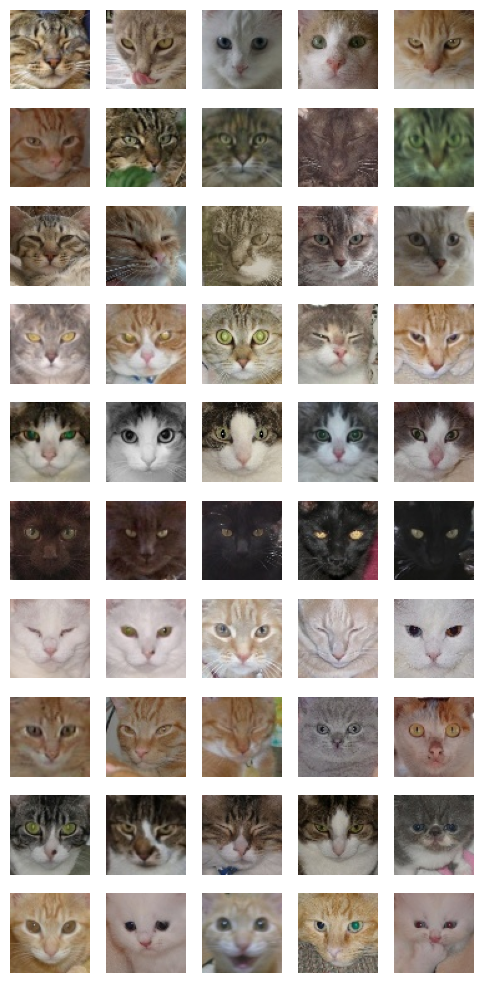

In [36]:
plt.figure(figsize=(5, 10))
for i, cluster in enumerate(np.unique(clusters)):
    cluster_points = cats_projection[clusters == cluster]
    cat_imgs = cats[clusters == cluster]
    cluster_center = cluster_points.mean(axis=0)
    # Считаем расстояния до центра от каждой точки кластера
    distances = np.linalg.norm(cluster_center - cluster_points, axis=1)
    closest_idxs = np.argsort(distances)
    sorted_cats = cat_imgs[closest_idxs]
    _, idx = np.unique(sorted_cats, return_index=True, axis=0)
    # Берем топ-5 уникальных ответов, соответствующих полученным индексам
    closest_answers = sorted_cats[np.sort(idx)][:5]
    for j, image in enumerate(closest_answers):
        plt.subplot(10, 5, 5 * i + j + 1)
        plt.imshow(image.reshape(64, 64, 3))
        plt.axis("off")
plt.tight_layout()
plt.show()

Опишите отличительные черты кластеров:

Фактически мы получили те же самые кластеры

Сильно ли они отличаются от предыдущего способа?

Как мы видим у нас уже стало меньше пересечений по кластерам, по крайне мере они есть, но меньше